<a href="https://colab.research.google.com/github/AndresAriasM/Proyecto_Grupal/blob/main/TrabajoFinal_PreparacionDatos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Proyecto Final Minería de Datos

### Camilo Velásquez Hincapié
### Tomás Cardona Montoya
### Andrés Arias Medina

#Preparación de Datos

#Dataset: Cancer Data

#Variable objetivo: diagnosis (Benigno (B) o Maligno (M))

In [ ]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

Lectura de datos (CSV)

In [ ]:
data = pd.read_csv("Cancer_Data.csv", sep=',')
data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

Verificación de filas con nulos

In [ ]:
#Identificación de nulos
data.isna().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [ ]:
#Identificación de registros con duplicados
duplicados=data.duplicated("id",keep=False)
duplicados.unique()

array([False])

Se descarta la presencia de algún registro repetido, por ende procede a borrarse la columna id junto con "Unnamed" por ser irrelevantes

In [ ]:
#Variables irrelevantes
data=data.drop(["Unnamed: 32","id"],axis=1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

##Descripción estadistica

In [ ]:
#Clasificacion de columnas de tipo númerico
numericos = (data.dtypes == "float64")
numericos_list = list(numericos[numericos].index)

print("Variables numéricas:")
print(numericos_list)

Variables numéricas:
['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


<Axes: xlabel='diagnosis', ylabel='count'>

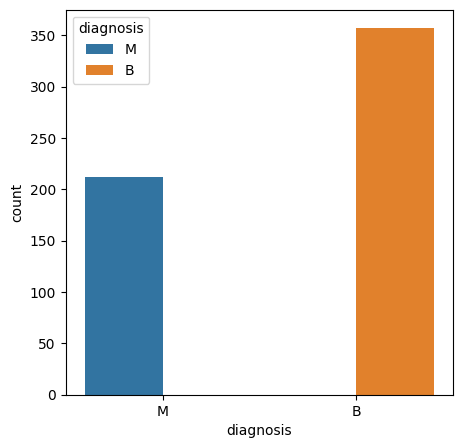

In [ ]:
plt.figure(figsize=(5,5))
sns.countplot(x="diagnosis", data=data, hue="diagnosis")

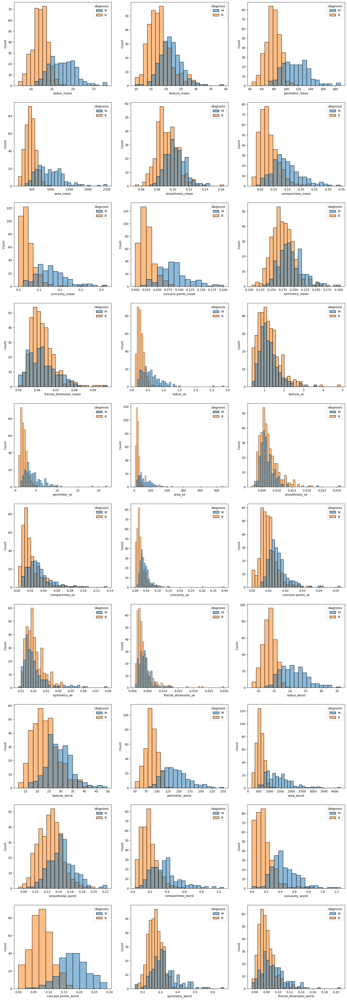

In [ ]:
plt.figure(figsize=(20,60))
for i in range(1, len(data.columns)) :
    plt.subplot(10,3,i)
    sns.histplot(x=data.columns[i], data=data, hue="diagnosis")

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 23.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 23.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 23.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 23.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 23.0% of the points cannot be plac

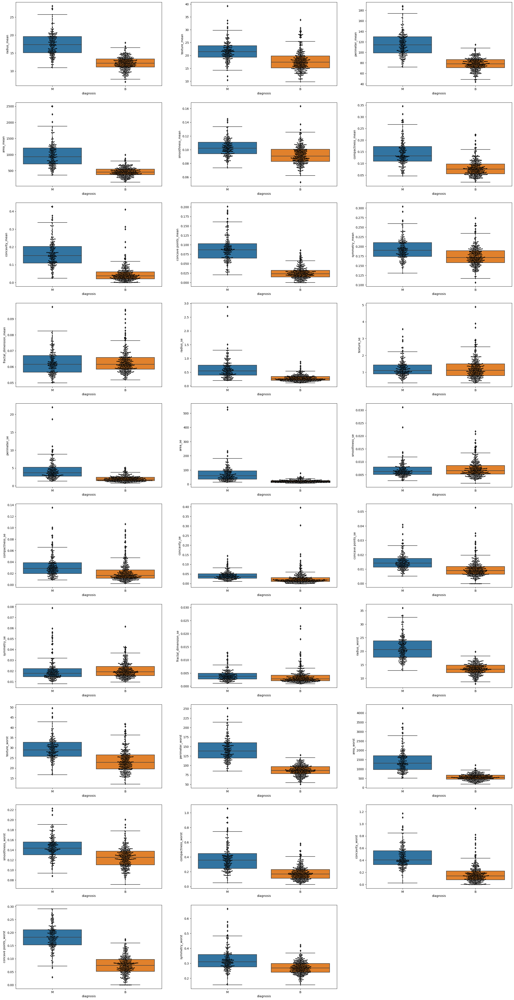

In [ ]:
plt.figure(figsize=(30,60))
for i in range(1, len(numericos_list)) :
    plt.subplot(10,3,i)
    sns.swarmplot(x=data['diagnosis'],y=data.columns[i], data=data, color="black",size=3)
    sns.boxplot(x=data["diagnosis"], y=data.columns[i], data=data)

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 23.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 23.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 23.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 23.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:3544: UserWarning: 23.0% of the points cannot be plac

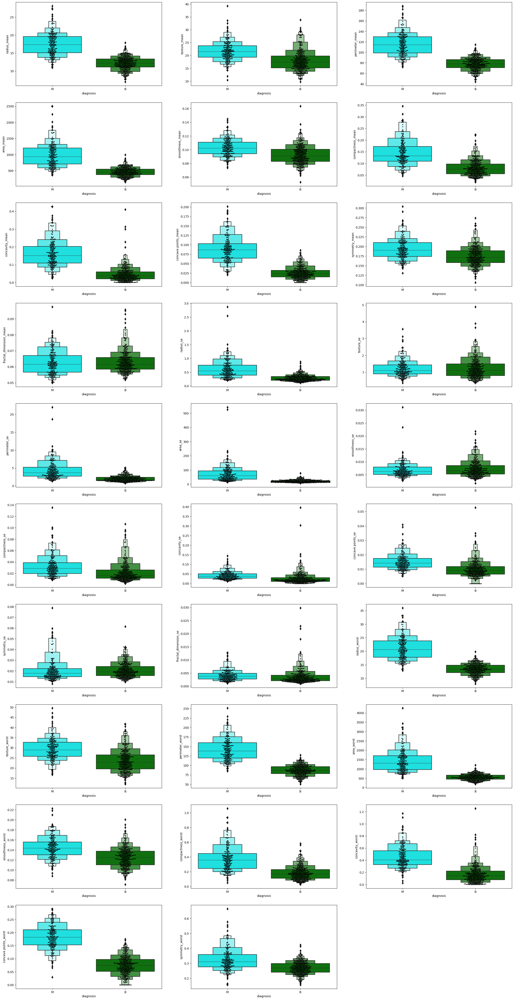

In [ ]:
plt.figure(figsize=(30,60))
for i in range(1, len(numericos_list)) :
    plt.subplot(10,3,i)
    sns.swarmplot(x=data['diagnosis'],y=data.columns[i], data=data, color="black",size=3)
    sns.boxenplot(x=data["diagnosis"], y=data.columns[i], data=data, palette=["cyan","green"])

array([[<Axes: xlabel='radius_mean', ylabel='radius_mean'>,
        <Axes: xlabel='texture_mean', ylabel='radius_mean'>,
        <Axes: xlabel='perimeter_mean', ylabel='radius_mean'>,
        <Axes: xlabel='area_mean', ylabel='radius_mean'>,
        <Axes: xlabel='smoothness_mean', ylabel='radius_mean'>,
        <Axes: xlabel='compactness_mean', ylabel='radius_mean'>,
        <Axes: xlabel='concavity_mean', ylabel='radius_mean'>,
        <Axes: xlabel='concave points_mean', ylabel='radius_mean'>,
        <Axes: xlabel='symmetry_mean', ylabel='radius_mean'>,
        <Axes: xlabel='fractal_dimension_mean', ylabel='radius_mean'>,
        <Axes: xlabel='radius_se', ylabel='radius_mean'>,
        <Axes: xlabel='texture_se', ylabel='radius_mean'>,
        <Axes: xlabel='perimeter_se', ylabel='radius_mean'>,
        <Axes: xlabel='area_se', ylabel='radius_mean'>,
        <Axes: xlabel='smoothness_se', ylabel='radius_mean'>,
        <Axes: xlabel='compactness_se', ylabel='radius_mean'>,
      

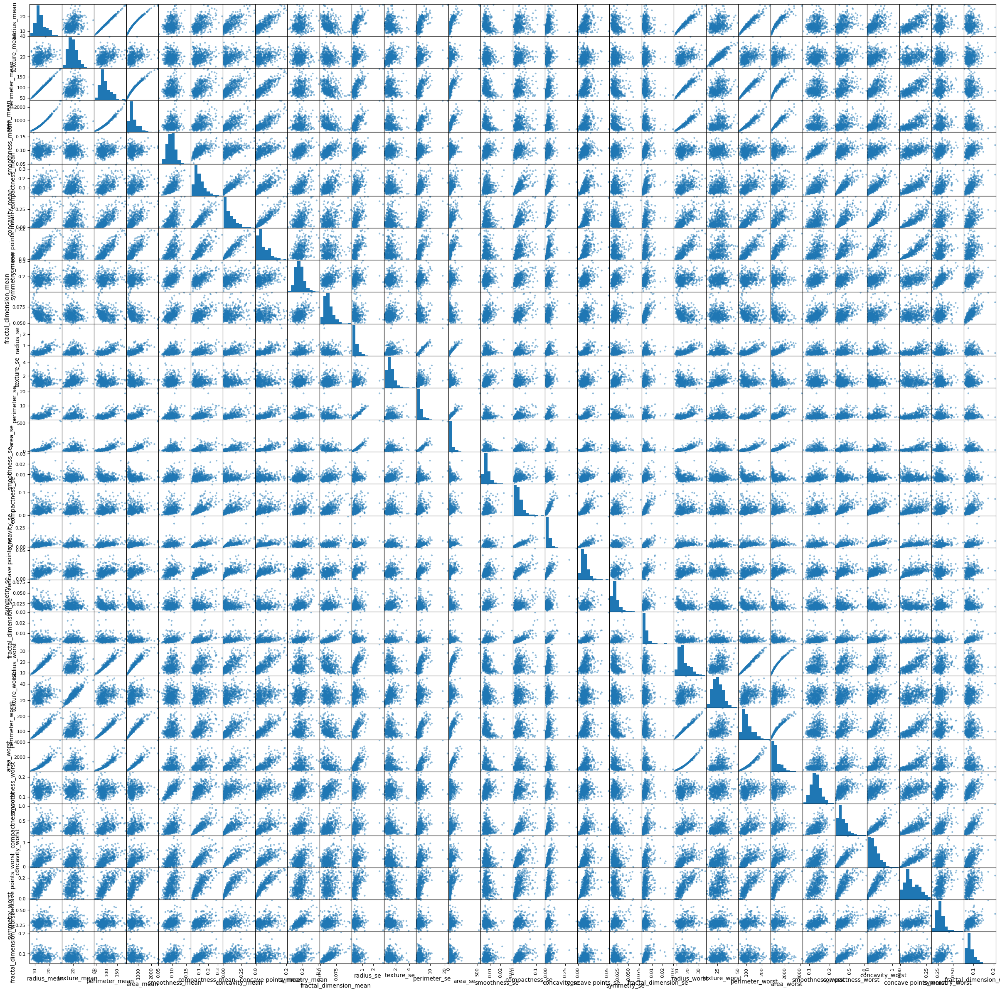

In [ ]:
# Gráficas para identificar relaciones entre las variables
pd.plotting.scatter_matrix(data, figsize=(30,30))

In [ ]:
# Desinstalar e instalar pandas profiling
!pip uninstall pandas-profiling -y -q
!pip install pandas-profiling[notebook] -q

In [ ]:
# Cargar librería para Profiling
from pandas_profiling import ProfileReport
 
profile_data=ProfileReport(data, minimal=True) # minimal=True
profile_data

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##Manejo de correlaciones

In [ ]:
# Todas las variables deben ser numéricas para calcular las correlaciones
# Se crean dummies para las variables categóricas
 
data_num = pd.get_dummies(data, drop_first=True)
data_num.head()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,diagnosis_M
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,1
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,1
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,1
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,1
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,1


<Axes: >

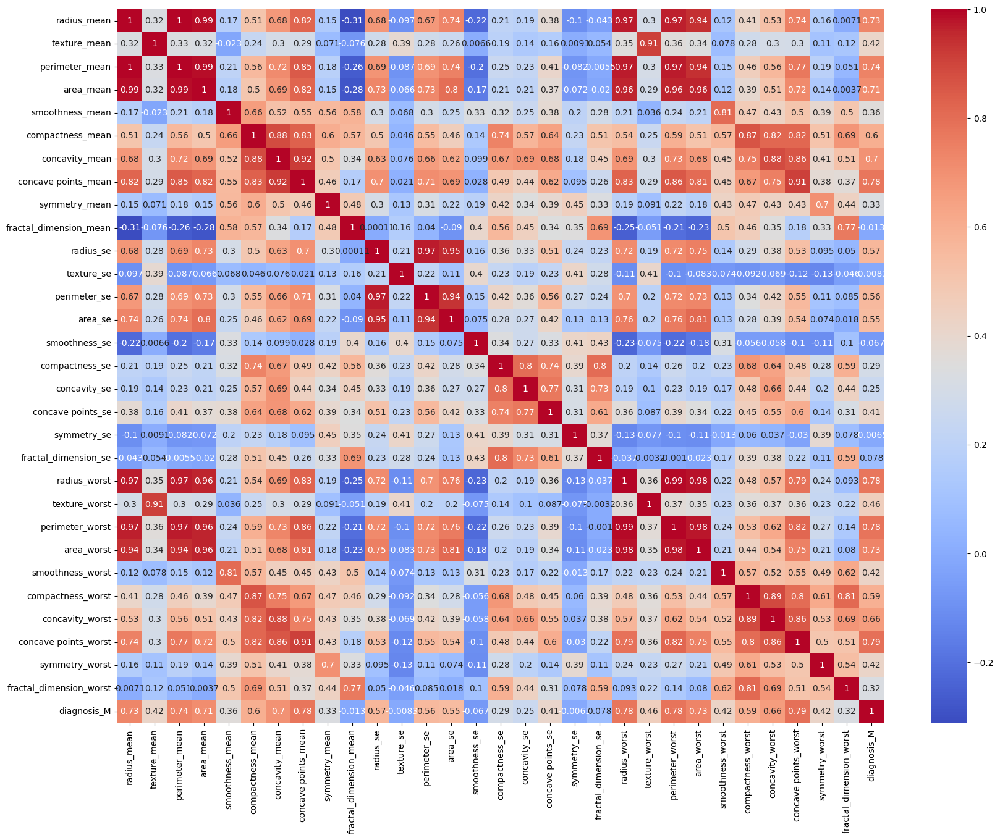

In [ ]:
plt.figure(figsize=(20,15))
sns.heatmap(data_num.corr(), annot= True, cmap="coolwarm")

<ipython-input-84-570e347c5446>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  plt.matshow(data.corr(), fignum=f.number)


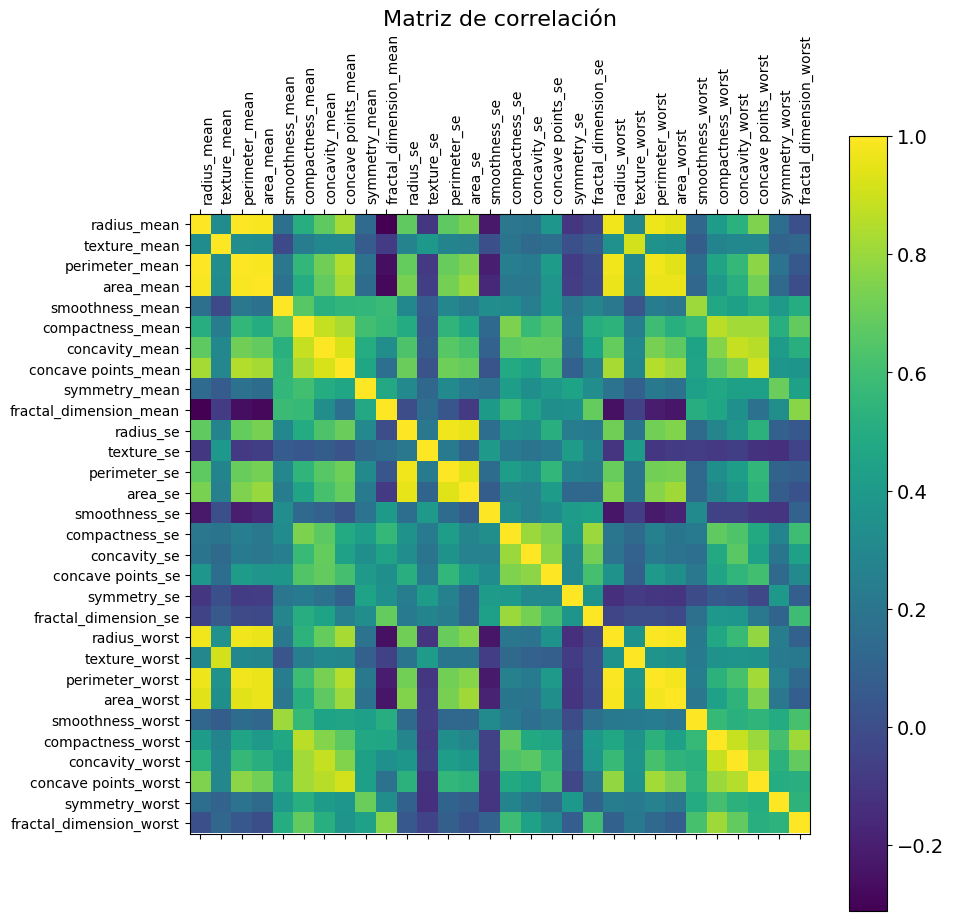

In [ ]:
f = plt.figure(figsize=(10, 10))
plt.matshow(data.corr(), fignum=f.number)
plt.xticks(range(data.select_dtypes(['number']).shape[1]), data.select_dtypes(['number']).columns, fontsize=10, rotation=90, ha="left")
plt.yticks(range(data.select_dtypes(['number']).shape[1]), data.select_dtypes(['number']).columns, fontsize=10)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Matriz de correlación', fontsize=16);

In [ ]:
#Eliminar variables con correlación mayor a 0.80
corr_matrix = data.corr().abs()

# Crear una matriz booleana 
high_corr = (corr_matrix > 0.80) & ~np.eye(corr_matrix.shape[0], dtype=bool)

# Variables con alta correlación
variables_a_eliminar = set()

for i in range(len(high_corr.columns)):
    for j in range(i):
        if high_corr.iloc[i, j]:
            colname = high_corr.columns[i]
            variables_a_eliminar.add(colname)

data = data.drop(variables_a_eliminar, axis=1)

<ipython-input-85-f7cf8be8d6bf>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = data.corr().abs()


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   diagnosis               569 non-null    object 
 1   radius_mean             569 non-null    float64
 2   texture_mean            569 non-null    float64
 3   smoothness_mean         569 non-null    float64
 4   compactness_mean        569 non-null    float64
 5   symmetry_mean           569 non-null    float64
 6   fractal_dimension_mean  569 non-null    float64
 7   radius_se               569 non-null    float64
 8   texture_se              569 non-null    float64
 9   smoothness_se           569 non-null    float64
 10  compactness_se          569 non-null    float64
 11  concave points_se       569 non-null    float64
 12  symmetry_se             569 non-null    float64
 13  symmetry_worst          569 non-null    float64
dtypes: float64(13), object(1)
memory usage: 62

<ipython-input-87-1533b79f9aff>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot= True, cmap="coolwarm")


<Axes: >

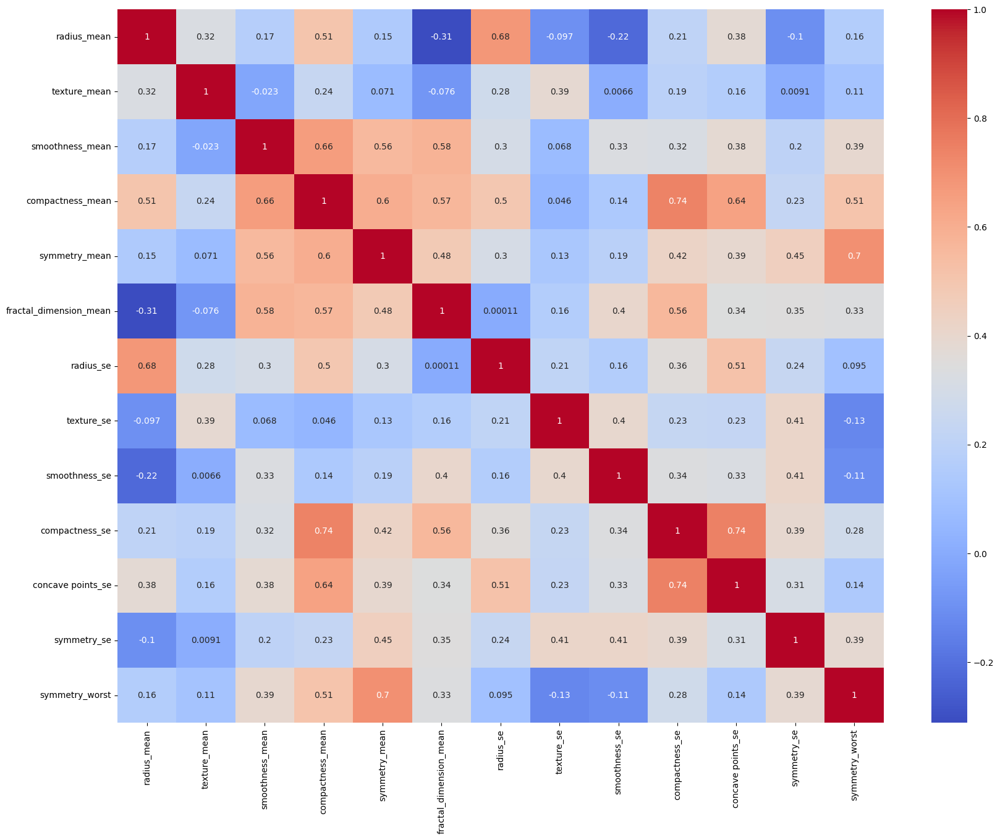

In [ ]:
#Nueva matriz de correlación
plt.figure(figsize=(20,15))
sns.heatmap(data.corr(), annot= True, cmap="coolwarm")

<Axes: >

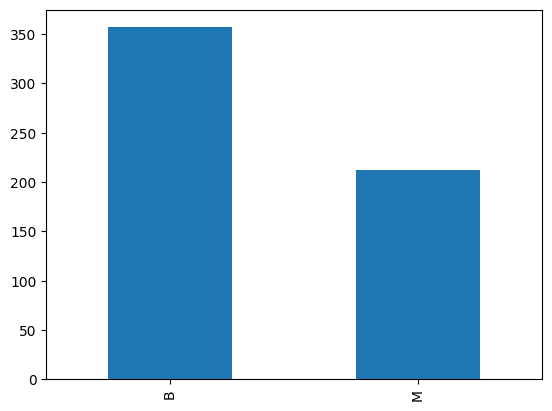

In [ ]:
#Balanceo de datos

#Variable objetivo
pd.value_counts(data["diagnosis"]).plot(kind="bar")

In [ ]:
from imblearn.over_sampling import SMOTE

# Separar las variables predictoras y la variable objetivo
X = data.drop('diagnosis', axis=1)
y = data['diagnosis']

smote = SMOTE()
X_balanceado, y_balanceado = smote.fit_resample(X, y)

<Axes: >

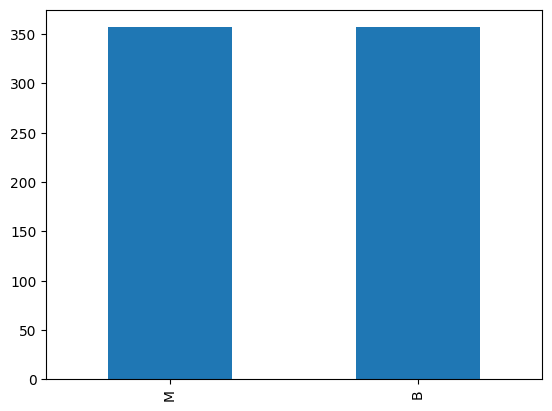

In [ ]:
# Creamos un dataframe con los resultados
data  = pd.DataFrame(columns=X.columns.values, data=X_bal)
data['diagnosis']=Y_bal
data['diagnosis'].value_counts().plot(kind='bar')